# NHVSing V3 — Re-synthesis Demo (+ NSF-HiFiGAN & RTF comparison)

Re-synthesizes ground-truth WAV files with the exported **NHVSing V3** model (a single self-contained ONNX: NN + DSP) and compares them against the originals — and, optionally, against **NSF-HiFiGAN**.

**Requirements:** Run from the repository root.
- Export the model first so `exported_models/v3/nhv_v3.onnx` exists:
  `python export.py --config config_v3.yaml --ckpt <weights.ckpt>`
- RMVPE weights (~173 MB) auto-download on first run.
- **(Optional) NSF-HiFiGAN comparison:** obtain the OpenVPI `nsf_hifigan` ONNX (e.g. extract `nsf_hifigan.onnx` from OpenUtau's `nsf_hifigan.oudep`) and set `NSF_ONNX_PATH` below. If the file is absent, the NSF cells are skipped automatically.

(For the OpenUtau / hop512 grid, swap in `exported_models/v3/nhv_v3x.onnx` — same interface.)

In [1]:
import sys, time
from pathlib import Path

import numpy as np
import soundfile as sf
import librosa
import matplotlib.pyplot as plt
import onnxruntime as ort
import yaml
from IPython.display import Audio, display

sys.path.insert(0, str(Path('.').resolve()))

CONFIG_PATH   = 'config_v3.yaml'
ONNX_PATH     = 'exported_models/v3/nhv_v3.onnx'     # V3 単一 ONNX(hop512 用は nhv_v3x.onnx)
NSF_ONNX_PATH = 'exported_models/nsf_hifigan.onnx'   # 任意: 無ければ NSF 比較は自動スキップ
SAMPLES = [
    ('wav/sample_wav/ground_truth_kiritan.wav', 'Touhoku Kiritan'),
    ('wav/sample_wav/ground_truth_natsume.wav', 'Natsume Yuri'),
]

with open(CONFIG_PATH) as f:
    cfg = yaml.safe_load(f)
pp = cfg['preprocess']
SR = pp['sample_rate']

In [2]:
from preprocess import make_mel_fn, rmvpe_f0, clean_jumps
from dataset import norm_interp_f0
from tools.f0.algorithms.rmvpe import RMVPEPitchAlgorithm

# --- NHVSing V3(単一 ONNX: mel/f0/uv -> waveform/harmonic/noise, hop256 ln-mel)---
sess = ort.InferenceSession(ONNX_PATH, providers=['CPUExecutionProvider'])
print('V3 ONNX in :', [i.name for i in sess.get_inputs()], '| out:', [o.name for o in sess.get_outputs()])

wav_to_mel = make_mel_fn(pp)                          # 44.1k / hop256 / 128-mel(40-16000) / ln
rmvpe = RMVPEPitchAlgorithm(sample_rate=SR, hop_size=pp['hop_size'], fmin=pp['f0_min'], fmax=pp['f0_max'])
thr = rmvpe._get_default_threshold()

/opt/homebrew/Caskroom/miniforge/base/envs/zhejiang/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


V3 ONNX in : ['mel', 'f0', 'uv'] | out: ['waveform', 'harmonic', 'noise']


In [3]:
# --- NSF-HiFiGAN(任意・hop512 / log10 mel。入力 mel[1,T,128]+f0[1,T]）---
nsf_sess, nsf_in = None, []
if Path(NSF_ONNX_PATH).exists():
    nsf_sess = ort.InferenceSession(NSF_ONNX_PATH, providers=['CPUExecutionProvider'])
    nsf_in = [i.name for i in nsf_sess.get_inputs()]
    print('NSF-HiFiGAN ONNX in:', nsf_in, '| out:', [o.name for o in nsf_sess.get_outputs()])
else:
    print(f'NSF-HiFiGAN をスキップ({NSF_ONNX_PATH} が無い)。nsf_hifigan.onnx を置けば比較されます。')

def wav_to_mel_nsf(y):
    # NSF 用: hop512 / log10 / 128-mel(40-16000) / center=False + reflect(V3 と同じ帯域規約, hop と log 底のみ違う)
    NFFT, WIN, HOP = pp['fft_size'], pp['win_size'], pp['hop_size'] * 2
    basis = librosa.filters.mel(sr=SR, n_fft=NFFT, n_mels=pp['mel_dim'], fmin=pp['mel_min'], fmax=pp['mel_max'])
    pad = (NFFT - HOP) // 2
    yp = np.pad(y.astype(np.float64), (pad, pad), mode='reflect')
    S = np.abs(librosa.stft(yp, n_fft=NFFT, hop_length=HOP, win_length=WIN, window='hann', center=False))
    return np.log10(np.maximum(1e-5, basis @ S)).astype(np.float32)     # [128, T512] log10

NSF-HiFiGAN ONNX in: ['mel', 'f0'] | out: ['waveform']


In [4]:
def synthesize(wav_path):
    # GT wav -> 特徴量 -> V3(+NSF)で再合成。返り: (gt, v3, nsf|None, sr)
    gt, sr0 = sf.read(wav_path)
    if gt.ndim == 2:
        gt = gt.mean(axis=1)
    gt = gt.astype(np.float32)
    if sr0 != SR:
        gt = librosa.resample(gt.astype(np.float64), orig_sr=sr0, target_sr=SR).astype(np.float32)

    mel = wav_to_mel(gt)                                          # [128, T] ln (hop256)
    f0_raw = clean_jumps(rmvpe_f0(rmvpe, thr, gt, mel.shape[1]))  # RMVPE + 跳躍除外(0=無声)
    cf0, uv = norm_interp_f0(f0_raw)                              # 連続 F0 + uv(1=無声)
    T = min(mel.shape[1], len(cf0))

    v3 = sess.run(['waveform'], {
        'mel': mel[:, :T].T[None].astype(np.float32),                 # [1, T, 128]
        'f0':  np.asarray(cf0)[:T][None, None].astype(np.float32),    # [1, 1, T]
        'uv':  np.asarray(uv)[:T][None, None].astype(np.float32),     # [1, 1, T]
    })[0].reshape(-1)

    nsf = None
    if nsf_sess is not None:
        mel512 = wav_to_mel_nsf(gt)                              # [128, T512] log10 (hop512)
        f0_512 = np.asarray(f0_raw)[::2]                         # 生F0(0=無声)を hop512 へ
        T2 = min(mel512.shape[1], len(f0_512))
        feeds = {'mel': mel512[:, :T2].T[None].astype(np.float32), 'f0': f0_512[:T2][None].astype(np.float32)}
        nsf = nsf_sess.run(None, {k: v for k, v in feeds.items() if k in nsf_in})[0].reshape(-1)
    return gt, v3, nsf, SR


def compute_mel(y):
    return wav_to_mel(y)                                          # 表示は全部 hop256 ln で揃える


def show(wav_path, title):
    gt, v3, nsf, sr = synthesize(wav_path)
    sep = '=' * 60
    print(sep); print(f'  {title}'); print(sep)

    print('\n▶ Ground Truth');            display(Audio(gt, rate=sr))
    print('\n▶ NHVSing V3');              display(Audio(v3, rate=sr))
    if nsf is not None:
        print('\n▶ NSF-HiFiGAN');         display(Audio(nsf, rate=sr))

    panes = [('Ground Truth', gt), ('NHVSing V3', v3)] + ([('NSF-HiFiGAN', nsf)] if nsf is not None else [])
    mels = [(t, compute_mel(w)) for t, w in panes]
    T = min(m.shape[1] for _, m in mels)
    fig, axes = plt.subplots(1, len(mels), figsize=(7 * len(mels), 4), sharey=True)
    axes = np.atleast_1d(axes)
    fig.subplots_adjust(left=0.05, right=0.9, top=0.85, bottom=0.12, wspace=0.08)
    kw = dict(aspect='auto', origin='lower', vmin=-12, vmax=2, cmap='magma')   # ln-mel のレンジ
    for ax, (t, m) in zip(axes, mels):
        im = ax.imshow(m[:, :T], **kw); ax.set_title(f'{title} — {t}'); ax.set_xlabel('Frame')
    axes[0].set_ylabel('Mel bin')
    fig.colorbar(im, cax=fig.add_axes([0.92, 0.12, 0.012, 0.73]), label='ln')
    plt.show()

/var/folders/4f/0t33fb_x0xn19wj4p9yprz9m0000gn/T/ipykernel_91711/1357488906.py:17: RuntimeWarning: divide by zero encountered in matmul
  return np.log10(np.maximum(1e-5, basis @ S)).astype(np.float32)     # [128, T512] log10
/var/folders/4f/0t33fb_x0xn19wj4p9yprz9m0000gn/T/ipykernel_91711/1357488906.py:17: RuntimeWarning: overflow encountered in matmul
  return np.log10(np.maximum(1e-5, basis @ S)).astype(np.float32)     # [128, T512] log10
/var/folders/4f/0t33fb_x0xn19wj4p9yprz9m0000gn/T/ipykernel_91711/1357488906.py:17: RuntimeWarning: invalid value encountered in matmul
  return np.log10(np.maximum(1e-5, basis @ S)).astype(np.float32)     # [128, T512] log10


  Touhoku Kiritan

▶ Ground Truth



▶ NHVSing V3



▶ NSF-HiFiGAN


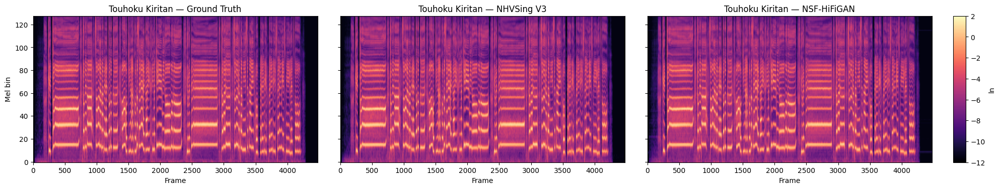

In [5]:
show(*SAMPLES[0])  # Touhoku Kiritan

/var/folders/4f/0t33fb_x0xn19wj4p9yprz9m0000gn/T/ipykernel_91711/1357488906.py:17: RuntimeWarning: divide by zero encountered in matmul
  return np.log10(np.maximum(1e-5, basis @ S)).astype(np.float32)     # [128, T512] log10
/var/folders/4f/0t33fb_x0xn19wj4p9yprz9m0000gn/T/ipykernel_91711/1357488906.py:17: RuntimeWarning: overflow encountered in matmul
  return np.log10(np.maximum(1e-5, basis @ S)).astype(np.float32)     # [128, T512] log10
/var/folders/4f/0t33fb_x0xn19wj4p9yprz9m0000gn/T/ipykernel_91711/1357488906.py:17: RuntimeWarning: invalid value encountered in matmul
  return np.log10(np.maximum(1e-5, basis @ S)).astype(np.float32)     # [128, T512] log10


  Natsume Yuri

▶ Ground Truth



▶ NHVSing V3



▶ NSF-HiFiGAN


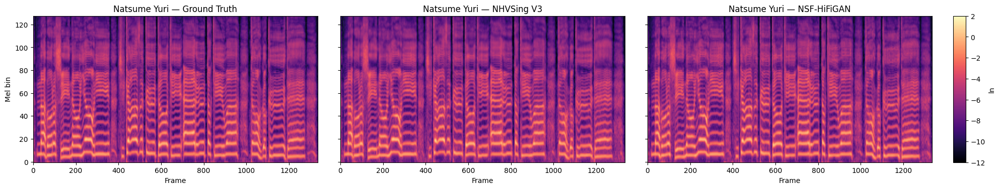

In [6]:
show(*SAMPLES[1])  # Natsume Yuri

## RTF & model-size comparison

Real-Time Factor (RTF = inference time / audio duration; lower is faster) on this machine's CPU (ONNX Runtime), plus on-disk model size. NHVSing V3 puts the waveform synthesis in DSP, so the neural net — and the file — are tiny compared to HiFi-GAN-family vocoders.

In [7]:
def rtf_onnx(session, feeds, dur, n=7):
    for _ in range(2):
        session.run(None, feeds)
    ts = []
    for _ in range(n):
        t = time.perf_counter(); session.run(None, feeds); ts.append(time.perf_counter() - t)
    return float(np.median(ts)) / dur

SEC = 5.0
# V3: hop256
Tv = int(round(SEC * SR / pp['hop_size']))
fx = {'mel': np.random.randn(1, Tv, pp['mel_dim']).astype(np.float32),
      'f0':  (np.random.rand(1, 1, Tv) * 200 + 150).astype(np.float32),
      'uv':  (np.random.rand(1, 1, Tv) > 0.2).astype(np.float32)}
rtf_v3 = rtf_onnx(sess, fx, SEC)
size_v3 = Path(ONNX_PATH).stat().st_size / 1024 / 1024

print(f'{"Model":<16}{"RTF":>10}{"xRealtime":>12}{"ONNX MB":>10}')
print('-' * 48)
print(f'{"NHVSing V3":<16}{rtf_v3:>10.4f}{1/rtf_v3:>11.0f}x{size_v3:>10.2f}')
if nsf_sess is not None:
    Tn = int(round(SEC * SR / (pp['hop_size'] * 2)))
    fn = {'mel': np.random.randn(1, Tn, pp['mel_dim']).astype(np.float32),
          'f0':  (np.random.rand(1, Tn) * 200 + 150).astype(np.float32)}
    fn = {k: v for k, v in fn.items() if k in nsf_in}
    rtf_nsf = rtf_onnx(nsf_sess, fn, SEC)
    size_nsf = Path(NSF_ONNX_PATH).stat().st_size / 1024 / 1024
    print(f'{"NSF-HiFiGAN":<16}{rtf_nsf:>10.4f}{1/rtf_nsf:>11.0f}x{size_nsf:>10.2f}')
    print('-' * 48)
    print(f'V3 is {rtf_nsf / rtf_v3:.1f}x faster and {size_nsf / size_v3:.0f}x smaller than NSF-HiFiGAN.')
else:
    print('(NSF-HiFiGAN 未設定のため V3 のみ)')

Model                  RTF   xRealtime   ONNX MB
------------------------------------------------
NHVSing V3          0.0705         14x      2.10


NSF-HiFiGAN         0.2709          4x     54.10
------------------------------------------------
V3 is 3.8x faster and 26x smaller than NSF-HiFiGAN.
